# IMPORT LIBRARIES

In [120]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.express as px
from sklearn.metrics import mean_squared_error
sns.set()

# PNJ Data

## Read data

In [121]:
# Đọc dữ liệu
pnj_data = pd.read_csv("PNJ.csv")
pnj_data

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
0,PNJ,2/28/2018 9:15,78.14,78.99,78.14,78.99,270,0
1,PNJ,2/28/2018 9:16,78.94,78.94,78.94,78.94,10,0
2,PNJ,2/28/2018 9:19,78.14,78.14,78.14,78.14,283,0
3,PNJ,2/28/2018 9:20,78.14,78.14,78.14,78.14,480,0
4,PNJ,2/28/2018 9:21,78.14,78.14,78.14,78.14,146,0
...,...,...,...,...,...,...,...,...
125304,PNJ,12/22/2020 14:22,78.20,78.20,78.20,78.20,5000,0
125305,PNJ,12/22/2020 14:23,78.20,78.20,78.20,78.20,1700,0
125306,PNJ,12/22/2020 14:24,78.20,78.20,78.20,78.20,870,0
125307,PNJ,12/22/2020 14:25,78.10,78.10,78.10,78.10,13000,0


- Dữ liệu có tổng cộng: **125309 dòng và 8 cột**

In [122]:
# Kiểm tra dòng trùng
print("Number of duplicated rows: ",np.sum(pnj_data.duplicated()))

Number of duplicated rows:  0


- Dữ liệu không có dòng trùng nhau

In [123]:
# Kiểm tra kiểu dữ liệu
pnj_data.dtypes

Ticker            object
Date/Time         object
Open             float64
High             float64
Low              float64
Close            float64
Volume             int64
Open Interest      int64
dtype: object

In [124]:
# Chuyển đổi kiểu dữ liệu cột Date/Time từ object sang datetime
pnj_data["Date/Time"] = pd.to_datetime(pnj_data["Date/Time"], format="%m/%d/%Y %H:%M")
pnj_data["Date/Time"]

0        2018-02-28 09:15:00
1        2018-02-28 09:16:00
2        2018-02-28 09:19:00
3        2018-02-28 09:20:00
4        2018-02-28 09:21:00
                 ...        
125304   2020-12-22 14:22:00
125305   2020-12-22 14:23:00
125306   2020-12-22 14:24:00
125307   2020-12-22 14:25:00
125308   2020-12-22 14:46:00
Name: Date/Time, Length: 125309, dtype: datetime64[ns]

## Descriptive Statistics

### Numerical data 

In [125]:
nume_df = pnj_data.select_dtypes(include=np.number)
missing_percentage = np.sum(nume_df.isna(), axis=0)*100/len(pnj_data)
mean_sr = np.mean(nume_df, axis=0)
std_sr = np.std(nume_df, axis =0)
median_sr = np.median(nume_df, axis=0)
max_sr = np.max(nume_df, axis=0)
min_sr = np.min(nume_df,axis=0)
statistic_df = pd.DataFrame({"Missing Percentage": missing_percentage,"Mean":mean_sr, "Standard Deviation": std_sr, "Median": median_sr, "Max":max_sr, "Min": min_sr})
statistic_df.T

,Open,High,Low,Close,Volume,Open Interest
Missing Percentage,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
Mean,72.182052,72.372590,72.042287,72.179371,3031.830451,0.0
Standard Deviation,9.900223,9.995747,9.830808,9.899362,7248.924044,0.0
Median,72.800000,73.010000,72.640000,72.830000,1000.000000,0.0
Max,100.160000,100.160000,100.160000,100.160000,580730.000000,0.0
Min,44.430000,44.530000,44.040000,44.140000,1.000000,0.0


**Nhận xét:**
- Các cột thuộc tính đều không có dữ liệu bị thiếu
- Không có các dòng dữ liệu trùng nhau
- Các cột dữ liệu đều có giá trị dương, không có giá trị không hợp lệ (invalid data)
- Cột Open Interest có các giá trị đều là 0.0, khi thiết kế mô hình dự đoán có thể cân nhắc loại bỏ cột này

### Categorical data

In [126]:
# Kiểm tra khoảng của dữ liệu thời gian
oldest_dt = pnj_data["Date/Time"].sort_values().values[0]
latest_dt = pnj_data["Date/Time"].sort_values().values[-1]
oldest_dt, latest_dt

(numpy.datetime64('2018-02-28T09:15:00.000000000'),
 numpy.datetime64('2020-12-22T14:46:00.000000000'))

**Do thị trường chứng khoán mở phiên vào 9:00 và đóng cửa lúc 15:00 nên cần kiểm tra thời gian có thoả mãn điều kiện này hay không?**
- Hàm *check_datetime* sẽ kiểm tra từng giá trị trong thuộc tính Date/Time, trả về True nếu thoả điều kiện ngược lại trả về False
- Biến *number_valid_value* là số những dữ liệu thoả điều kiện
- Cuối cùng sẽ in ra số dữ liệu không thoả mãn: *len(data) - number_valid_value*

In [127]:
def check_datetime(datetime):
    time = datetime.time()
    start = dt.time(9,0)
    end = dt.time(15,0)
    if time>=start and time<=end:
        return True
    return False

number_valid_value = np.sum(pnj_data["Date/Time"].apply(check_datetime))

print("\nSo du lieu thoi gian khong hop le: ", len(pnj_data) - number_valid_value, "\n")


So du lieu thoi gian khong hop le:  0 



In [128]:
cate_df = pnj_data.select_dtypes(include=["object","datetime"])
missing_percentage = np.sum(cate_df.isna(), axis=0)*100/len(pnj_data)
unique_sr = cate_df.nunique(axis=0)
statistic_df = pd.DataFrame({"Missing Percentage": missing_percentage,"Num_unique": unique_sr})
statistic_df

,Missing Percentage,Num_unique
Ticker,0.0,1
Date/Time,0.0,125309


**Nhận xét:**
- Các nhãn cổ phiếu đều đồng nhất (mã PNJ)
- Các giá trị date/time là phân biệt, không có giá trị thời gian trùng lặp
- Không có dữ liệu không hợp lệ, các giao dịch trong ngày đều nằm trong khoảng thời gian **9:00 - 15:00**

## Data Visualization

In [129]:
# Biểu đồ thể hiện biến động giá mở cửa và đóng cửa theo thời gian 
fig1 = px.line(pnj_data, x="Date/Time", y="Open",color_discrete_sequence=["green"], title="Open price by date")
fig2 = px.line(pnj_data, x="Date/Time", y="Close",color_discrete_sequence=["red"], title="Close price by date")
fig1.update_layout(
    autosize=False,
    width=1000,
    height=500)
fig2.update_layout(
    autosize=False,
    width=1000,
    height=500)
fig1.show()
fig2.show()

In [130]:
fig3 = px.bar(pnj_data.groupby(pnj_data["Date/Time"].dt.date)["Volume"].mean().reset_index(), x="Date/Time", y="Volume",color_discrete_sequence=["red"],title="Volume by date")
fig3.update_layout(
    autosize=False,
    width=1000,
    height=600)
fig3.show()

In [131]:
mean_squared_error(pnj_data["Open"], pnj_data["Close"])

0.31518423098101495

**Nhận xét:**
- Biến thiên giá Open và Close có sự chênh lệch không nhiều, độ đo MSE= 0.315184 với 125309 mẫu 


**Trực quan hoá yếu tố Trend, Seasonality, Noise của chuỗi thời gian**

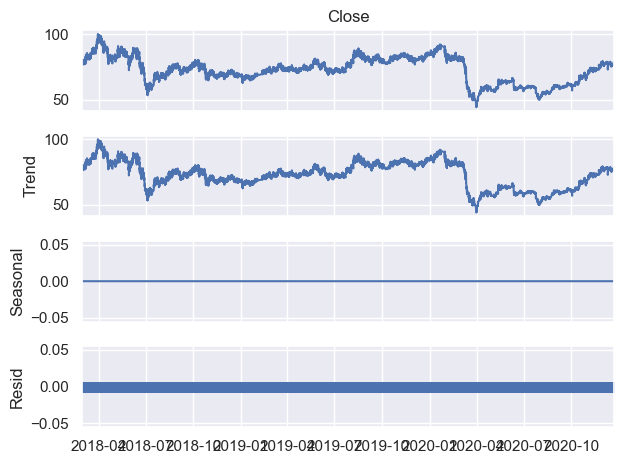

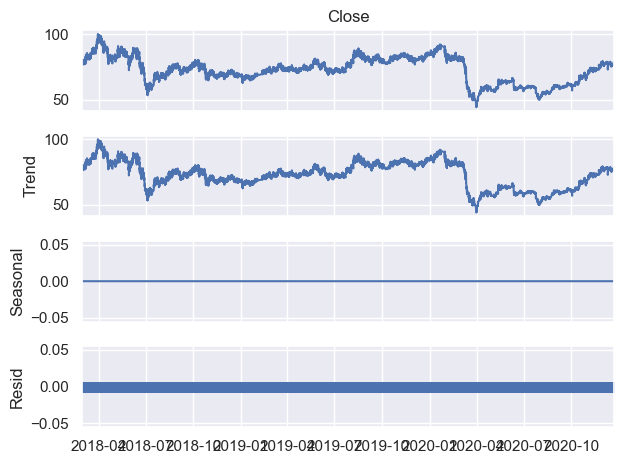

In [132]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

df = pnj_data.copy()
df = df.set_index(["Date/Time"])

#Ta xem giá trị chuỗi thời gian là tổng các yếu tố Trend, Seasonality và Noise


result_add = seasonal_decompose(df["Close"], model='additive',extrapolate_trend='freq', period=1)

result_add.plot()


**Nhận xét:**
- Giá cổ phiếu không có tính seasonality 

## Data Exploration

In [133]:
# Số ngày giao dịch
len(pnj_data.groupby(pnj_data["Date/Time"].dt.date))

709

In [134]:
#Tổng lượng cổ phiếu giao dịch
total_volume = np.sum(pnj_data["Volume"])
total_volume

379915642

In [135]:
# Xem ngày có giá đóng cửa thấp nhất
pnj_data.groupby(pnj_data["Date/Time"].dt.date).apply(lambda x: x.sort_values("Date/Time").iloc[-1]).sort_values("Close").head(10)

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
Date/Time,,,,,,,,
2020-03-31,PNJ,2020-03-31 14:46:00,45.90,45.90,45.90,45.90,32360,0
2020-03-30,PNJ,2020-03-30 14:46:00,47.27,47.27,47.27,47.27,18460,0
2020-04-01,PNJ,2020-04-01 14:46:00,48.60,48.60,48.60,48.60,25870,0
2020-03-23,PNJ,2020-03-23 14:46:00,50.11,50.11,50.11,50.11,6920,0
2020-03-24,PNJ,2020-03-24 14:46:00,50.31,50.31,50.31,50.31,34640,0
2020-03-27,PNJ,2020-03-27 14:46:00,50.79,50.79,50.79,50.79,15160,0
2020-07-30,PNJ,2020-07-30 14:46:00,51.50,51.50,51.50,51.50,16340,0
2020-07-29,PNJ,2020-07-29 14:46:00,51.50,51.50,51.50,51.50,24820,0
2020-07-31,PNJ,2020-07-31 14:46:00,51.60,51.60,51.60,51.60,69170,0


In [136]:
# Xem ngày có giá đóng cửa cao nhất
pnj_data.groupby(pnj_data["Date/Time"].dt.date).apply(lambda x: x.sort_values("Date/Time", ascending=False).iloc[-1]).sort_values("Close",
                                                                                                                                 ascending=False).head(10)

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
Date/Time,,,,,,,,
2018-04-02,PNJ,2018-04-02 09:15:00,98.50,98.50,98.50,98.50,369,0
2018-04-04,PNJ,2018-04-04 09:15:00,96.13,96.13,95.90,96.13,1440,0
2018-04-03,PNJ,2018-04-03 09:15:00,95.94,95.94,95.94,95.94,385,0
2018-04-05,PNJ,2018-04-05 09:15:00,95.19,95.19,95.19,95.19,424,0
2018-04-06,PNJ,2018-04-06 09:15:00,94.24,94.24,94.00,94.00,1702,0
2018-03-30,PNJ,2018-03-30 09:15:00,93.76,93.76,93.76,93.76,264,0
2018-03-29,PNJ,2018-03-29 09:15:00,93.29,93.29,93.24,93.24,579,0
2018-04-11,PNJ,2018-04-11 09:15:00,91.40,91.40,91.40,91.40,1222,0
2020-01-22,PNJ,2020-01-22 09:15:00,89.06,91.00,89.06,91.00,12670,0


In [137]:
# Xem ngày có lượng giao dịch nhiều nhất
pnj_data.groupby(pnj_data["Date/Time"].dt.date)["Volume"].sum().sort_values(ascending=False)

Date/Time
2020-05-12    2362950
2020-06-08    2208530
2020-01-31    2087700
2020-09-23    2082610
2020-06-11    2000670
               ...   
2018-04-12      16673
2018-03-12      16145
2018-03-15      12195
2018-04-05      11045
2018-02-28       8158
Name: Volume, Length: 709, dtype: int64

In [138]:
# Kiểm tra ngày có khối lượng giao dịch cao nhất
df = pnj_data.groupby(pnj_data["Date/Time"].dt.date)["Volume"].sum()
df = df.drop(columns=["Date/Time"]).reset_index()
df["Date/Time"] = pd.to_datetime(df["Date/Time"])
df.loc[(df["Date/Time"].dt.month==5) & (df["Date/Time"].dt.year==2020),:]

,Date/Time,Ticker,Open,High,Low,Close,Volume,Open Interest
543,2020-05-04,PNJ,56.5,56.5,56.5,56.5,33780,0
544,2020-05-05,PNJ,56.0,56.0,56.0,56.0,24180,0
545,2020-05-06,PNJ,56.5,56.5,56.5,56.5,37270,0
546,2020-05-07,PNJ,57.5,57.5,57.5,57.5,31890,0
547,2020-05-08,PNJ,58.2,58.2,58.2,58.2,48910,0
548,2020-05-11,PNJ,59.7,59.7,59.7,59.7,59680,0
549,2020-05-12,PNJ,63.8,63.8,63.8,63.8,214310,0
550,2020-05-13,PNJ,64.9,64.9,64.9,64.9,87960,0
551,2020-05-14,PNJ,63.6,63.6,63.6,63.6,87430,0
552,2020-05-15,PNJ,62.0,62.0,62.0,62.0,79860,0


In [140]:
# Thống kê cho từng năm
pnj_data.iloc[:,1:].groupby(by=pnj_data["Date/Time"].dt.year).mean()

,Date/Time,Open,High,Low,Close,Volume,Open Interest
Date/Time,,,,,,,
2018,2018-07-30 06:37:02.439405824,75.329417,75.587566,75.148668,75.329666,2035.657377,0.0
2019,2019-07-14 09:16:27.850286080,76.701160,76.946124,76.526427,76.697712,2651.576893,0.0
2020,2020-07-01 12:52:47.690330624,65.981708,66.075520,65.902263,65.977506,4096.420976,0.0


**Nhận xét:**
- Tổng thời gian cổ phiếu PNJ giao dịch trong khoảng thời gian trên là **709 ngày** giao dịch đi kèm với tổng khối lượng giao dịch lên đến **379.915.642 cổ phiếu**. Nhìn vào khung đồ thị ngày, ta dễ dàng thấy PNJ giao dịch biến động rất mạnh. Có thời điểm cổ phiếu chạm vùng giá đỉnh 98.500 đồng/1cp, là mức giá cao nhất được thiết lập vào ngày 2/4/2018. Sau đó vào ngày 31/3/2020, giá cổ phiếu rơi sâu nhất có lúc chạm ngưỡng giá 45.900 đồng/1cp. Các khoảng thời gian còn lại cổ phiếu biến động quanh vùng giá trung bình khoảng 50.000/1cp.
- Khối lượng giao dịch lớn tập trung vào từ giữa năm 2019 trở đi. Ngày **12/5/2020** đánh dấu là phiên có khối lượng giao dịch lớn nhất lên tới **2.363 triệu cổ phiếu** đi kèm với mức tăng giá => 1 phiên giao dịch với lực cầu áp đảo (giá tăng khối lượng tăng theo)


- Nhìn vào biểu đồ giá đóng cửa vào năm 2018, ta có thể thấy giá thiết lập 2 vùng đỉnh và 2 vùng đáy, tương ứng với các tác động từ sự kiện vĩ mô

        (1) Thị trường chứng khoán Việt Nam được xem xét nâng hạng
        (2) Trong năm 2018, thương chiến Mỹ - Trung gây tác động tiêu cực đến thị trường

## ARIMA MODEL

In [141]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA

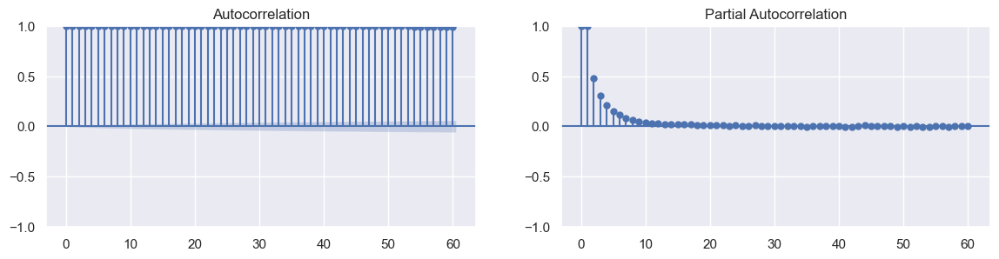

In [107]:
fig, axes = plt.subplots(1,2,figsize=(14,3), dpi= 100)
plot_acf(pnj_data["Close"].values.tolist(), lags=60,ax=axes[0])
plot_pacf(pnj_data["Close"].values.tolist(), lags=60, ax=axes[1]);

In [108]:
from pmdarima.arima import auto_arima
grid_arima = auto_arima(pnj_data["Close"].values, start_p=0, start_q=0, max_p=2, max_q=2,
                        d=0, start_P = 0, seasonal=False, ic=["aic"], trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1430381.791, Time=0.81 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=6.48 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=7.07 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=204365.416, Time=6.09 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=204365.988, Time=8.68 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=204366.028, Time=7.01 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=1103571.114, Time=13.19 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=2.33 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=204369.360, Time=6.03 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=204357.803, Time=50.35 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=773158.320, Time=8.87 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=3.17 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=204358.424, Time=47.35 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=204546.710, Time=18.67 sec
 ARIMA(0,0,0)(0,0,0)[0] int

In [109]:
grid_arima = auto_arima(pnj_data["Close"].values, start_p=0, start_q=0, max_p=2, max_q=2,
                       d=1, start_P = 0, seasonal=False, ic=["aic"], trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=262961.379, Time=7.20 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=229622.830, Time=3.61 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=204353.930, Time=11.32 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=262959.379, Time=0.80 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=204354.504, Time=20.94 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=204354.517, Time=18.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=204357.879, Time=18.38 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=204351.930, Time=3.37 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=204352.504, Time=5.05 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=204352.516, Time=5.04 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=229620.830, Time=1.27 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=204355.879, Time=4.72 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 99.967 seconds


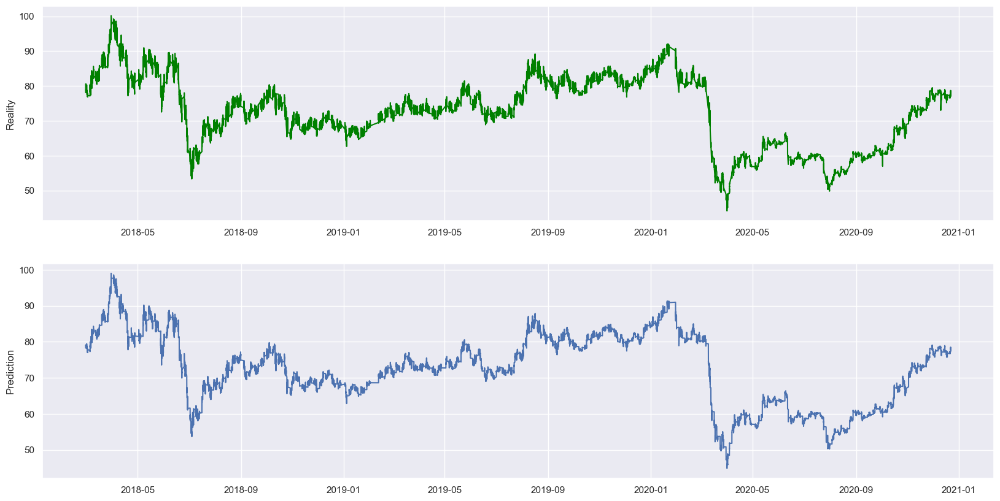

In [144]:
arima = ARIMA(pnj_data["Close"].values, order = (0,1,1))
model = arima.fit()
predict = model.predict()
predict[0] = predict[1]
fig, axes = plt.subplots(2,1,figsize=(20,10))
axes[1].plot(pnj_data["Date/Time"],predict)
axes[1].set_ylabel("Prediction")
axes[0].plot(pnj_data["Date/Time"], pnj_data["Close"], color="Green")
axes[0].set_ylabel("Reality")
plt.show()

In [145]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:               125309
Model:                 ARIMA(0, 1, 1)   Log Likelihood             -102173.965
Date:                Tue, 14 Nov 2023   AIC                         204351.930
Time:                        10:20:17   BIC                         204371.407
Sample:                             0   HQIC                        204357.782
                             - 125309                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7748      0.001   -675.821      0.000      -0.777      -0.773
sigma2         0.2991      0.001    398.158      0.000       0.298       0.301
===================================================================================
Ljung-Box (L1) (Q):                   0.83   Jarque-Bera (JB):             68971.49
Prob(Q):                              0.36   Prob(JB):                         0.00
Heteroskedasticity (H):               0.13   Skew:                             0.98
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.06
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

**Nhận xét:**
- Mô hình ARIMA(1,0,1) cho kết quả gần khớp với dữ liệu thực
- Độ đo AIC = 204353.930
- Các tham số của mô hình có p_value <0.05 => đều có ý nghĩa về mặt thống kê